## Generating prize words

In [1]:
import requests
from pathlib import Path
import matplotlib.pyplot as plt
from PIL import Image
import uuid
import hashlib


In [2]:
def get_hash_from_uuid(hash_val: str | None = None, hash_len: int = 5) -> str:
    # Generate a UUID4 and convert it to a string
    if not hash_val:
        hash_val = str(uuid.uuid4())

    # Hash the UUID string using SHA-256
    hash_object = hashlib.sha256(hash_val.encode())
    hex_dig = hash_object.hexdigest()
    return hex_dig[:hash_len]

In [3]:
FLUX_SERVER_ENDPOINT = 'http://192.165.134.27:22186/flux-generate-image'
FLUX_TIMEOUT = 300
save_dir = 'data_prize_words/generated'

In [5]:
Path(save_dir).exists()

True

In [9]:
def flux_get_image_from_prompt(
    prompt: str,
    save_path: str,
    resolution: tuple | None = None,
    num_inference_steps: int = 28,
    guidance_scale: float = 3.5,
    seed: int = 24,
) -> str:
    resolution = resolution if resolution else (1024, 1024)
    width, height = resolution
    data = {
        'prompt': prompt,
        'width': width,
        'height': height,
        'seed': seed,
        'num_inference_steps': num_inference_steps,
        'guidance_scale': guidance_scale,
    }

    response = requests.post(
        FLUX_SERVER_ENDPOINT,
        data=data,
        timeout=FLUX_TIMEOUT,
    )

    if response.status_code == 200:
        with Path(save_path).open('wb') as output_file:
            output_file.write(response.content)

        return save_path
    raise ValueError(f'Bad response from FLUX API. Status code: {response.status_code}')

In [22]:
gen_params = {
    'num_inference_steps': 28, 
    'guidance_scale': 3.5,
    'seed': 1,
    'resolution': (1024, 1024)
}

In [31]:

# Generate images
def generate_multiple_images(prompt, gen_params):
    words = ['MINI', 'MAJOR', 'MINOR',]
    generated_images = []
    
    for word in words:
        unique_save_path = Path(save_dir) / f"{word}_{get_hash_from_uuid(hash_val=prompt)}.png"
        generated_image = flux_get_image_from_prompt(prompt.format(word=word), save_path=unique_save_path, **gen_params)
        generated_images.append(generated_image)
    return generated_images


def generate_single_image(prompt, word, gen_params):
    unique_save_path = Path(save_dir) / f"{word}_{get_hash_from_uuid(hash_val=prompt)}.png"
    generated_image = flux_get_image_from_prompt(prompt=prompt, save_path=unique_save_path, **gen_params)
    return generated_image


def plot_images(images_paths):
    
    # Plot images in grid
    fig, axes = plt.subplots(1, len(images_paths), figsize=(15, 5))
    for ax, img_path in zip(axes, images_paths):
        image = plt.imread(img_path)
        ax.imshow(image)
        ax.set_title(f"Letter")
        ax.axis("off")
    
    plt.tight_layout()
    plt.show()

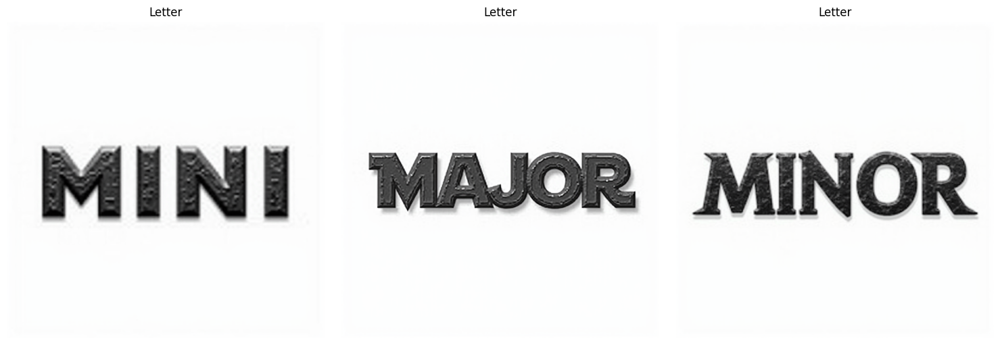

In [24]:
prompt="A bold word '{word}' in the iconic Star Wars title font, with sharp, angular lines and a futuristic, metallic texture. The word should be styled in a slightly weathered, distressed look, reminiscent of the original Star Wars logo. Each letter should be evenly spaced, forming a clean and cohesive word. The word must be centered and clearly visible on a pure white background, with no additional elements, shadows, or distractions. Ensure the design is monochromatic, impactful, and maintains the classic Star Wars aesthetic."


images_paths = generate_multiple_images(prompt=prompt, gen_params=gen_params)
plot_images(images_paths)

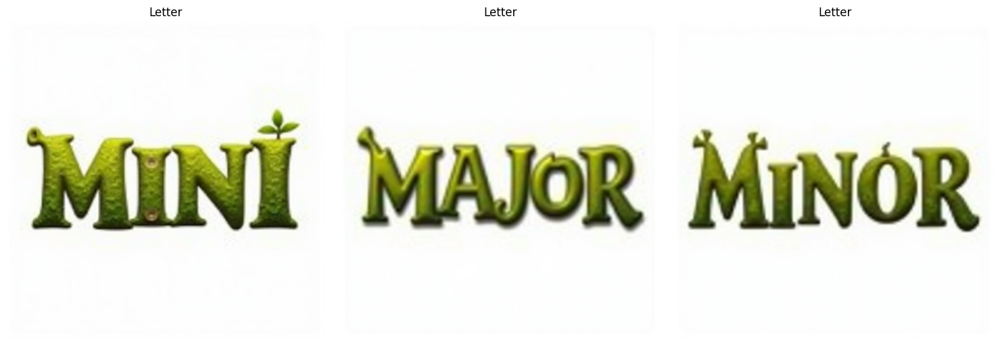

In [25]:
prompt = "A bold, playful word '{word}' inspired by the Shrek aesthetic, featuring smooth, organic shapes with a whimsical, fairy-tale theme. The letters should have an earthy green tone, resembling ogre skin, with soft rounded edges and a slightly textured, swamp-like appearance. Add subtle highlights to give a magical, storybook vibe. The word must be evenly spaced, centered, and stand out clearly on a pure white background, with no additional elements, shadows, or distractions. Avoid excessive details—focus on a flat, minimalistic yet playful design that reflects the quirky charm of Shrek."

images_paths = generate_multiple_images(prompt=prompt, gen_params=gen_params)
plot_images(images_paths)

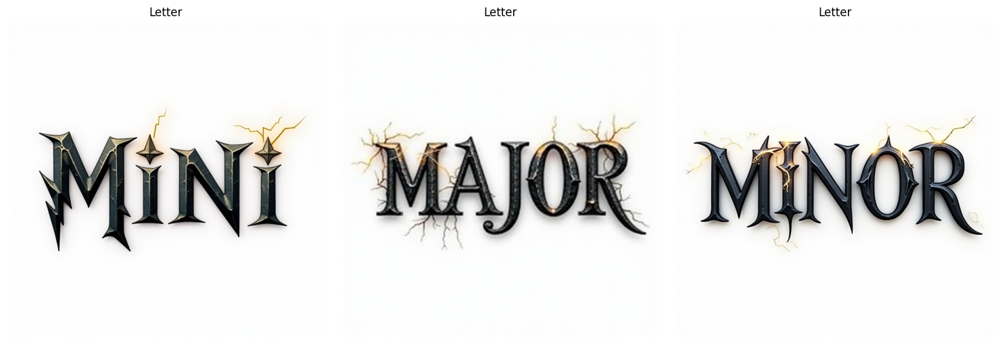

In [26]:
prompt = "A bold, mystical word '{word}' in the iconic Harry Potter aesthetic, featuring sharp, gothic-style letters with a magical, enchanted theme. The letters should have subtle, glowing edges or a metallic, weathered texture, inspired by the Hogwarts crest and wizardry. Incorporate delicate lightning-like cracks or faint sparks around the word to enhance the magical effect, but keep it minimalistic. The word must be evenly spaced, centered, and stand out clearly on a pure white background. Avoid excessive embellishments—focus on a flat, clean design that conveys the mystical and magical charm of the Harry Potter universe."

images_paths = generate_multiple_images(prompt=prompt, gen_params=gen_params)
plot_images(images_paths)

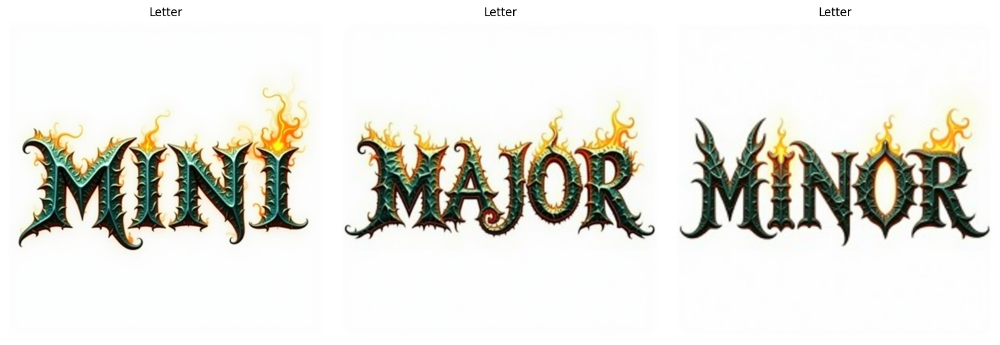

In [27]:
prompt = "A bold, enchanting word '{word}' in a mystical dragon-inspired style, featuring sharp, jagged letters with intricate dragon-scale textures. Each letter should have a fiery glow or iridescent sheen, with colors inspired by dragon elements such as molten gold, emerald green, or sapphire blue. Subtle smoke trails or flame-like wisps can curl around the word, adding a magical and mythical touch, but keep it minimal to maintain clarity. The word must be evenly spaced, centered, and stand out clearly on a pure white background. Avoid overly complex details—focus on a striking, mythical design that conveys the power and elegance of dragons."

images_paths = generate_multiple_images(prompt=prompt, gen_params=gen_params)
plot_images(images_paths)

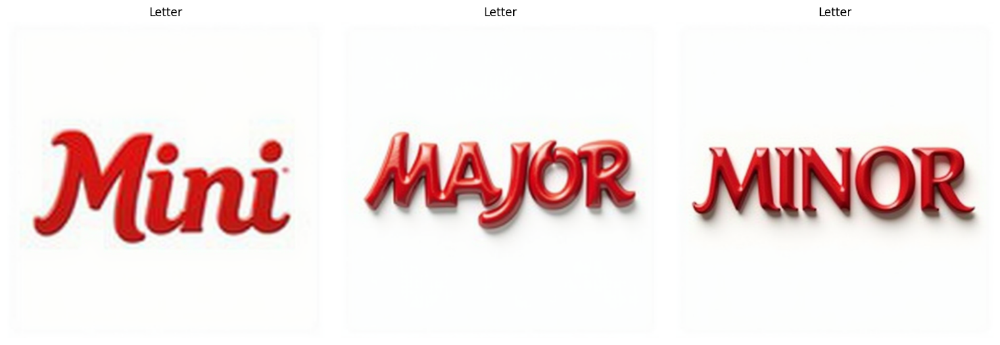

In [28]:
prompt = "A bold, elegant word '{word}' in the signature Coca-Cola aesthetic, featuring smooth, flowing, cursive-style letters with a glossy, vibrant red color and subtle white highlights to create a polished, 3D effect. The letters should have soft, swooping curves and a classic, retro-inspired design, reminiscent of the Coca-Cola logo. Ensure the word is evenly spaced, centered, and clearly visible on a pure white background. Avoid additional elements or textures—focus on a clean, minimalistic, and timeless look that captures the essence of Coca-Cola branding."

images_paths = generate_multiple_images(prompt=prompt, gen_params=gen_params)
plot_images(images_paths)

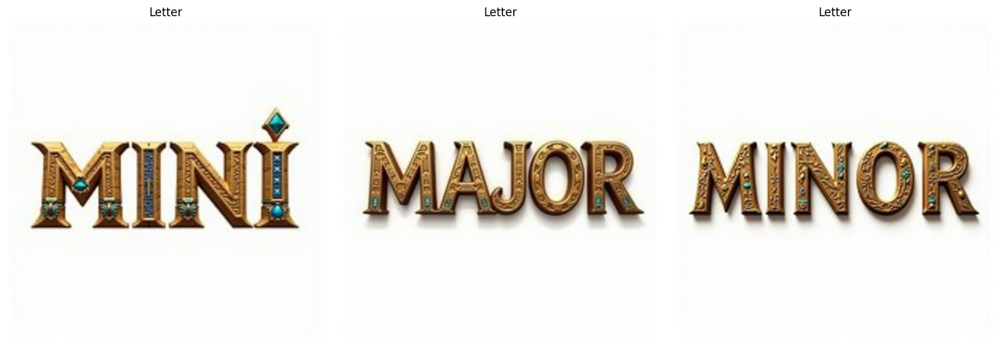

In [29]:
prompt = "A bold, regal word '{word}' inspired by ancient Egyptian aesthetics, featuring hieroglyphic-inspired letters with angular and geometric shapes. The letters should have a sandstone or gold texture with intricate carvings, evoking the look of ancient Egyptian monuments. Subtle accents like Pharaoh-inspired patterns, scarab motifs, or hints of lapis lazuli and turquoise can be incorporated around or within the letters to add authenticity. Ensure the word is evenly spaced, centered, and prominently displayed on a clean white background. Avoid excessive decoration—focus on a mystical yet minimalist design that captures the grandeur and mystery of ancient Egypt."

images_paths = generate_multiple_images(prompt=prompt, gen_params=gen_params)
plot_images(images_paths)

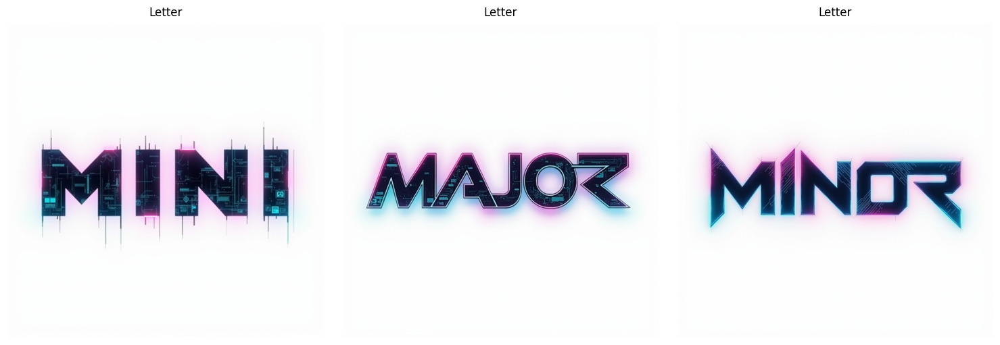

In [30]:
prompt = "A bold, futuristic word '{word}' in a cyberpunk aesthetic, featuring sleek, angular letters with a glowing neon effect in shades of electric blue, magenta, or neon green. The letters should have subtle circuit-like patterns or digital glitch effects to enhance the high-tech feel. Add a faint glowing aura around the word, giving it a holographic appearance. Ensure the word is evenly spaced, centered, and stands out sharply against a clean white background. Avoid overcrowding with details—focus on a sleek, modern design that captures the vibrant and edgy essence of cyberpunk."

images_paths = generate_multiple_images(prompt=prompt, gen_params=gen_params)
plot_images(images_paths)

In [ ]:
prompt = "A bold, futuristic word '{word}' in a cyberpunk aesthetic, featuring sleek, angular letters with a glowing neon effect in shades of electric blue, magenta, or neon green. The letters should have subtle circuit-like patterns or digital glitch effects to enhance the high-tech feel. Add a faint glowing aura around the word, giving it a holographic appearance. Ensure the word is evenly spaced, centered, and stands out sharply against a clean white background. Avoid overcrowding with details—focus on a sleek, modern design that captures the vibrant and edgy essence of cyberpunk."

images_paths = generate_multiple_images(prompt=prompt, gen_params=gen_params)
plot_images(images_paths)

In [35]:
gen_params = {
    'num_inference_steps': 28, 
    'guidance_scale': 3.5,
    'seed': 1,
    'resolution': (2048, 2048)
}

In [36]:
# # Example usage for a single image
single_prompt = "The stylized words 'MAJOR,' 'MINI,' 'MINOR,' and 'PRICE' are made in the same cyberpunk style, using a glowing neon texture. Their shapes emphasize a futuristic and edgy design, and subtle digital glitch effects add a high-tech, dynamic atmosphere. The main color is electric blue, complemented by magenta and neon green glows, which create a vibrant contrast. Circuit-like patterns and faint glowing auras can be seen on the surface, enhancing the futuristic impression. The background is made in a clean white style, emphasizing the neon glow and holographic effect. The word 'MAJOR' is located in the upper left corner. The word 'MINI' is in the upper right corner. The word 'MINOR' is located in the lower left corner. The word 'PRICE' occupies the lower right corner. All words are evenly spaced and aligned, ensuring the composition is balanced and visually engaging."
single_image_path = generate_single_image(prompt=single_prompt, word='PRICE', gen_params=gen_params)



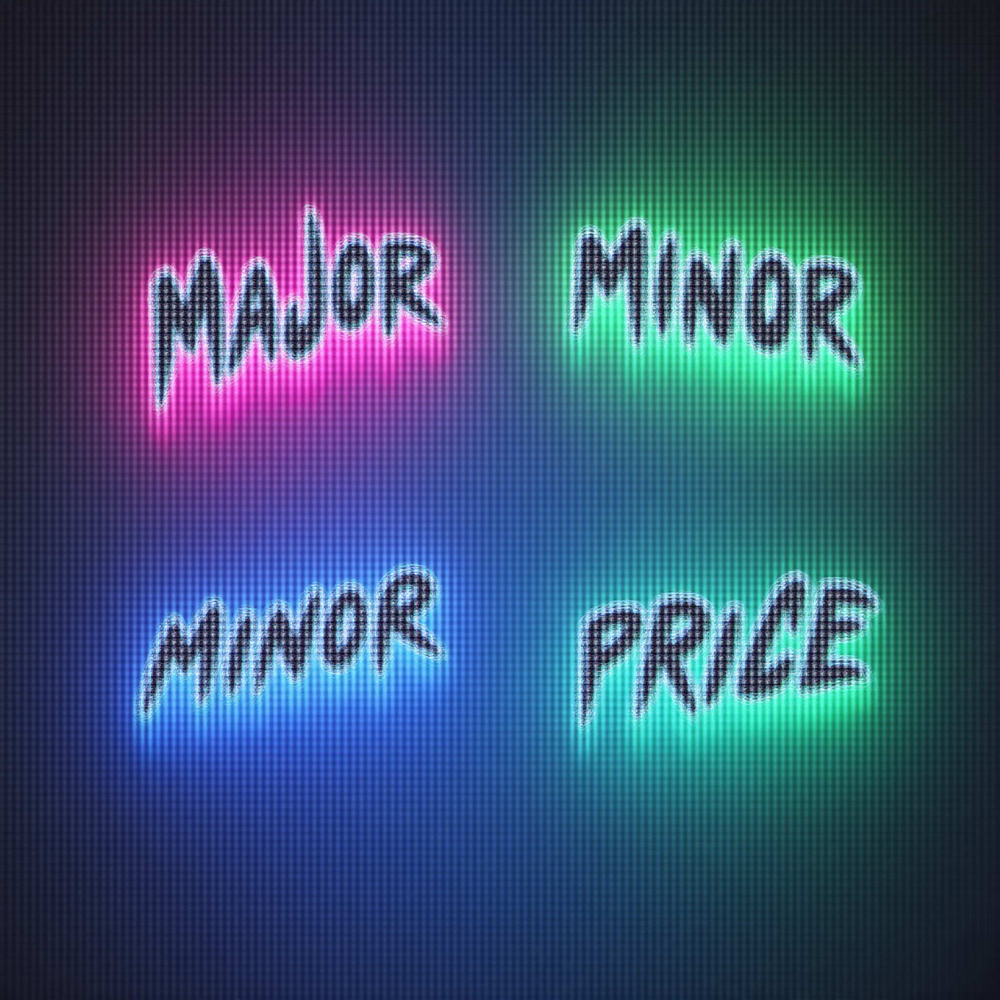

In [37]:
Image.open(single_image_path)

In [38]:
# # Example usage for a single image
single_prompt = "The stylized words 'MAJOR,' 'MINI,' 'MINOR,' and 'PRICE' are made in the same cyberpunk style, using a glowing neon texture. Their shapes emphasize a futuristic and edgy design, and subtle digital glitch effects add a high-tech, dynamic atmosphere. The main color is electric blue, complemented by magenta and neon green glows, which create a vibrant contrast. Circuit-like patterns and faint glowing auras can be seen on the surface, enhancing the futuristic impression. The background is completely pure white, with no textures, shadows, or gradients, emphasizing the neon glow and holographic effect of the words. The word 'MAJOR' is located in the upper left corner, the word 'MINI' is in the upper right corner, the word 'MINOR' is located in the lower left corner, and the word 'PRICE' occupies the lower right corner. All words are evenly spaced and aligned, ensuring the composition is clean, balanced, and visually engaging."
single_image_path = generate_single_image(prompt=single_prompt, word='PRICE', gen_params=gen_params)

In [39]:
single_image_path

PosixPath('data_prize_words/generated/PRICE_93551.png')

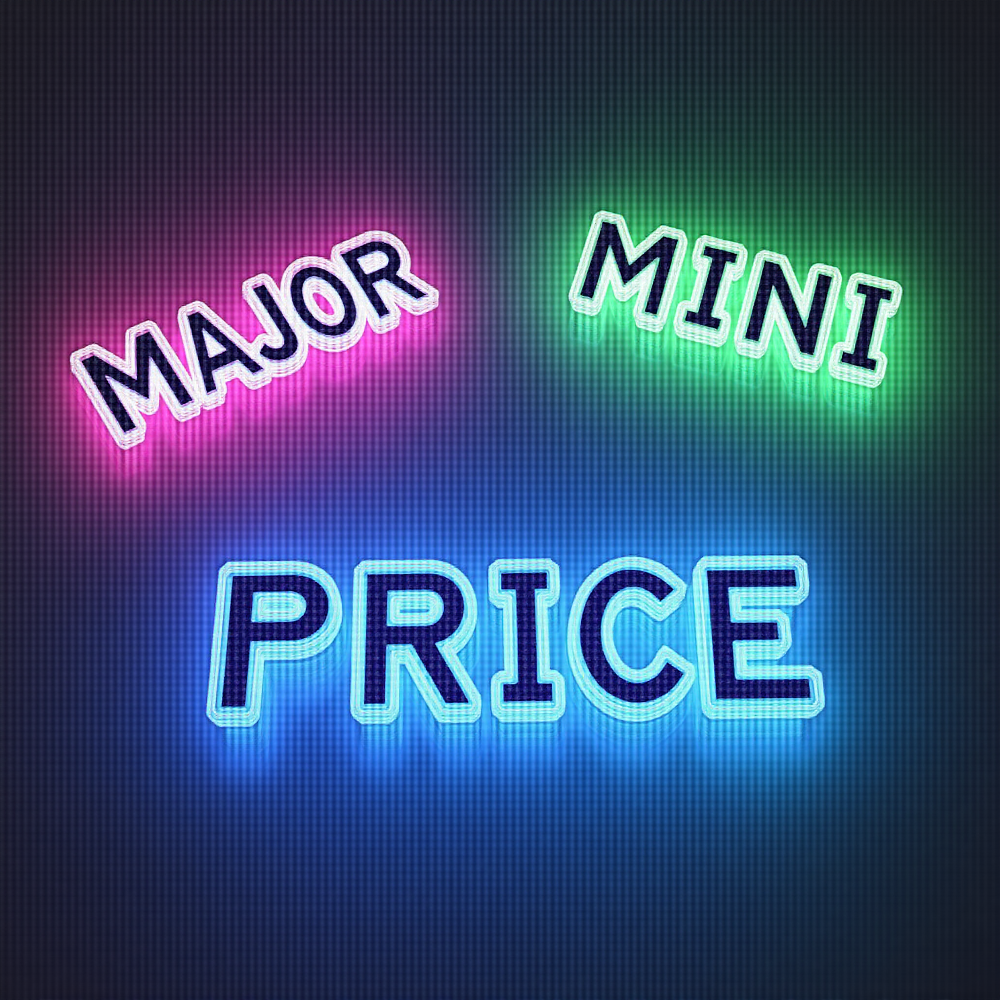

In [40]:
Image.open(single_image_path)